In [125]:
%matplotlib inline
from pylab import rcParams
rcParams['figure.figsize'] = 12, 8
import NV
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

Phi: 153.042979 +/- 0.577525
Theta: 46.799061 or +/- 0.468680
Phi(naive): 160.787000
Theta(naive): 49.463297


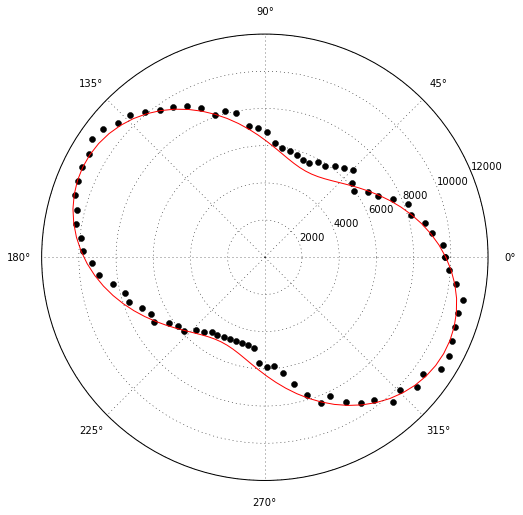

In [7]:
t = np.loadtxt(r'C:\Users\Ouyang Group\Documents\Data\7-18-16\MNP 2 wash on CPW 1mW scan 3 x103 y54 rotor sweep 2')
t[:,1] = t[:,1]-4000
NV.OrientPol(t)

In [109]:
from bokeh.plotting import figure, output_file, show
from bokeh.io import output_notebook
from bokeh import palettes
output_notebook()
TOOLS = "save,box_zoom,box_select,crosshair,hover,resize,reset"
import pandas as pd
import glob

Loading BokehJS ...

In [44]:


phi_0 = (153+13.8)*np.pi/180
th_0 = (46.7+9)*np.pi/180

theta = np.arccos(np.cos(phi_0)*np.sin(th_0))


files = glob.glob(r'C:\Users\Ouyang Group\Documents\Data\7-18-16\MNP 2 wash on CPW 5mW scan 3 x103 y54 ODMR T0 *V.txt')
output_file("7-18-16 MNP x103 y54 T0 ODMR.html")
bsweep = pd.concat((pd.read_table(f) for f in files),axis=1).values
bsweep = np.nan_to_num(bsweep)
diffs = bsweep[:,1::2]
Bs = np.linspace(0,1,len(files))*(11/0.5)
p = figure(x_range=[Bs[0],Bs[-1]], y_range=[bsweep[4,2],bsweep[-2,2]],tools=TOOLS)
p.image(image=[diffs],x=Bs[0], y=bsweep[4,0], dw=[Bs[-1]], dh=[bsweep[-2,0]-bsweep[4,0]], palette='RdPu9')
p.line(Bs,NV.ODMR_theory_min(Bs,theta),line_dash=(6,6),line_color='black')
p.line(Bs,NV.ODMR_theory_max(Bs,theta),line_dash=(6,6),line_color='black')

dt = 10*np.pi/180
p.line(Bs,NV.ODMR_theory_min(Bs,theta+dt),line_dash=(6,6),line_color='red')
p.line(Bs,NV.ODMR_theory_max(Bs,theta+dt),line_dash=(6,6),line_color='red')
p.line(Bs,NV.ODMR_theory_min(Bs,theta-dt),line_dash=(6,6),line_color='blue')
p.line(Bs,NV.ODMR_theory_max(Bs,theta-dt),line_dash=(6,6),line_color='blue')
show(p)

143.539994397
-59.185786 +/- 0.660471
61.403612 +/- 0.324689


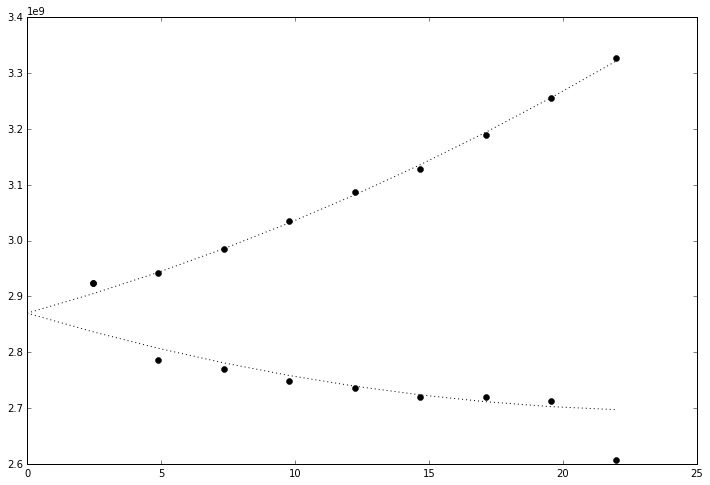

In [45]:
freq = bsweep[:,2]
fits = np.zeros((diffs.shape[1],6))
for i in range(0,diffs.shape[1]):
    O = diffs[:,i]*100
    opt, cov = curve_fit(NV.ODMRfit,freq,O,p0=(-4E8,freq[np.argmin(O)],1E7,-4E8,2.87E9*2-freq[np.argmin(O)],1E7),maxfev=2500)
    fits[i,:] = opt
    
mask = (fits[:,1]<fits[:,4])
mins = fits[:,1]*mask + fits[:,4]*~mask
maxs = fits[:,1]*~mask + fits[:,4]*mask

print theta*180/np.pi
opt1, cov = curve_fit(NV.ODMR_theory_min,Bs[2:9],mins[2:9],p0=(theta))
print "%2f +/- %2f" % (opt1*180/np.pi,np.sqrt(np.diag(cov))[0]*180/np.pi)
opt2, cov = curve_fit(NV.ODMR_theory_max,Bs[2:10],maxs[2:10],p0=(theta))
print "%2f +/- %2f" % (opt2*180/np.pi,np.sqrt(np.diag(cov))[0]*180/np.pi)

plt.plot(Bs[1:],mins[1:],'ko')
plt.plot(Bs[1:],maxs[1:],'ko')


plt.plot(Bs,NV.ODMR_theory_min(Bs,opt1),'k:')
plt.plot(Bs,NV.ODMR_theory_max(Bs,opt2),'k:')



In [8]:
def ODMR_MNP(B_0,phi_0,theta_0,b,phi_m,theta_m):
    #B_0 is the magnitude of the applied field from the GMW magnet
    #phi_0,theta_0 are the angle of the applied field
    #b is the field coefficient for the MNP, proportional to B_0
    #phi_m,theta_m are the angles of the MNP field
    
    D = 2.865E9
    g = 28E6 #MHz/mT, B should be in mT
    
    B_p = np.sqrt(B_0**2*((np.cos(phi_0)*np.sin(theta_0)+b*np.cos(phi_m)*np.sin(theta_m))**2 + 
                          (np.sin(phi_0)*np.sin(theta_0)+b*np.sin(phi_m)*np.sin(theta_m))**2))
    B_z = B_0*(np.cos(theta_0)+b*np.cos(theta_m))
    
    f_0 = D + 3*g**2*B_p**2/(2*D)
    f_1 = g*B_z*np.sqrt( 1 + (g*B_p**2/(2*D*B_z))**2)
    
    return f_0+f_1

In [128]:
phi_0 = (153+13.8)*np.pi/180
th_0 = (46.7+9)*np.pi/180
theta = np.arccos(np.cos(phi_0)*np.sin(th_0))

def ODMR_fit(B_0,b,phi_m,theta_m):
    return ODMR_MNP(B_0,phi_0,th_0,b,phi_m,theta_m)

files = glob.glob(r'C:\Users\Ouyang Group\Documents\Data\7-18-16\MNP 2 wash on CPW 5mW scan 3 x103 y54 ODMR T0 *V.txt')
output_file("7-18-16 MNP x103 y54 T0 ODMR.html")
bsweep = pd.concat((pd.read_table(f) for f in files),axis=1).values
bsweep = np.nan_to_num(bsweep)
diffs = bsweep[:,1::2]
Bs = np.linspace(0,1,len(files))*(11/0.5)


freq = bsweep[:,2]
fits = np.zeros((diffs.shape[1],6))
for i in range(0,diffs.shape[1]):
    O = diffs[:,i]*100
    opt, cov = curve_fit(NV.ODMRfit,freq,O,p0=(-4E8,freq[np.argmin(O)],1E7,-4E8,2.87E9*2-freq[np.argmin(O)],1E7),maxfev=2500)
    fits[i,:] = opt
    
mask = (fits[:,1]<fits[:,4])
mins = fits[:,1]*mask + fits[:,4]*~mask
maxs = fits[:,1]*~mask + fits[:,4]*mask

b_f = np.hstack((-Bs[3:7],Bs[2:10]))
f = np.hstack((mins[3:7],maxs[2:10]))

print theta*180/np.pi

b = ([0,0,0],[1000,2*np.pi,np.pi])
opt1, cov = curve_fit(ODMR_fit,b_f,f,p0=(0.2,0.001,0.001),bounds=b)
print "b: %2f +/- %2f" % (opt1[0],np.sqrt(np.diag(cov))[0])
print "phi: %2f +/- %2f" % (opt1[1]*180/np.pi,np.sqrt(np.diag(cov))[1]*180/np.pi)
print "theta: %2f +/- %2f" % (opt1[2]*180/np.pi,np.sqrt(np.diag(cov))[2]*180/np.pi)


p = figure(x_range=[Bs[0],Bs[-1]+(Bs[2]-Bs[1])], y_range=[bsweep[0,2],bsweep[-1,2]],tools=TOOLS)
p.image(image=[diffs],x=Bs[0], y=bsweep[0,0], dw=[Bs[-1]+(Bs[2]-Bs[1])], dh=[bsweep[-1,0]-bsweep[0,0]], palette='RdPu9')
Bps = np.append(Bs,Bs[-1]+(Bs[2]-Bs[1]))

p.line(Bps,ODMR_fit(Bps,*opt1),line_dash=(6,6),line_color='black')
p.line(Bps,ODMR_fit(-Bps,*opt1),line_dash=(6,6),line_color='black')

p.line(Bps,NV.ODMR_theory_min(Bps,theta),line_color='blue')
p.line(Bps,NV.ODMR_theory_max(Bps,theta),line_color='blue')

#p.circle(Bs[2:9],mins[2:9])
#p.circle(Bs[2:10],maxs[2:10])
show(p)

143.539994397
b: 0.126092 +/- 22421.160342
phi: 132.264081 +/- 22963690.218586
theta: 120.133918 +/- 5913913.292930


In [61]:
b = ([0,0,0],[1000,2*np.pi,np.pi])
for i in range(1,20):
    b_r = np.random.rand()
    opt1, cov = curve_fit(ODMR_fit,b_f,f,p0=(0,0.001,0.001),bounds=b)
    print "%d b: %2f +/- %2f" % (i,opt1[0],np.sqrt(np.diag(cov))[0])

1 b: 0.000000 +/- 0.018609
2 b: 0.000000 +/- 0.018609
3 b: 0.000000 +/- 0.018609
4 b: 0.000000 +/- 0.018609
5 b: 0.000000 +/- 0.018609
6 b: 0.000000 +/- 0.018609
7 b: 0.000000 +/- 0.018609
8 b: 0.000000 +/- 0.018609
9 b: 0.000000 +/- 0.018609
10 b: 0.000000 +/- 0.018609
11 b: 0.000000 +/- 0.018609
12 b: 0.000000 +/- 0.018609
13 b: 0.000000 +/- 0.018609
14 b: 0.000000 +/- 0.018609
15 b: 0.000000 +/- 0.018609
16 b: 0.000000 +/- 0.018609
17 b: 0.000000 +/- 0.018609
18 b: 0.000000 +/- 0.018609
19 b: 0.000000 +/- 0.018609


79.126557789
68.091317 +/- 0.533502
70.603765 +/- 0.242656
79.126557789
b: 0.274480 +/- 79126.459534
phi: 230.379544 +/- 28134108.859833
theta: 138.710461 +/- 18807950.139818


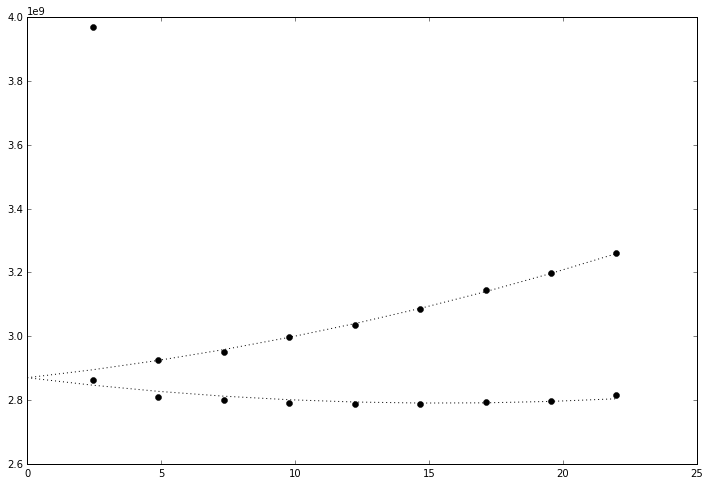

In [112]:
theta = np.arccos(np.sin(phi_0)*np.sin(th_0))
print theta*180/np.pi

files = glob.glob(r'C:\Users\Ouyang Group\Documents\Data\7-18-16\MNP 2 wash on CPW 5mW scan 3 x103 y54 ODMR T90 *V.txt')
output_file("7-18-16 MNP x103 y54 T90 ODMR.html")
bsweep = pd.concat((pd.read_table(f) for f in files),axis=1).values
bsweep = np.nan_to_num(bsweep)
diffs = bsweep[:,1::2]
Bs = np.linspace(0,1,len(files))*(11/0.5)+10**-6


freq = bsweep[:,2]
fits = np.zeros((diffs.shape[1],6))
for i in range(0,diffs.shape[1]):
    O = diffs[:,i]*100
    opt, cov = curve_fit(NV.ODMRfit,freq,O,p0=(-4E8,freq[np.argmin(O)],1E7,-4E8,2.87E9*2-freq[np.argmin(O)],1E7),maxfev=2500)
    fits[i,:] = opt
    
mask = (fits[:,1]<fits[:,4])
mins = fits[:,1]*mask + fits[:,4]*~mask
maxs = fits[:,1]*~mask + fits[:,4]*mask

opt1, cov = curve_fit(NV.ODMR_theory_min,Bs[1:10],mins[1:10],p0=(theta))
print "%2f +/- %2f" % (opt1*180/np.pi,np.sqrt(np.diag(cov))[0]*180/np.pi)
opt2, cov = curve_fit(NV.ODMR_theory_max,Bs[2:10],maxs[2:10],p0=(theta))
print "%2f +/- %2f" % (opt2*180/np.pi,np.sqrt(np.diag(cov))[0]*180/np.pi)

plt.plot(Bs[1:],mins[1:],'ko')
plt.plot(Bs[1:],maxs[1:],'ko')


plt.plot(Bs,NV.ODMR_theory_min(Bs,opt1),'k:')
plt.plot(Bs,NV.ODMR_theory_max(Bs,opt2),'k:')

b_f = np.hstack((-Bs[1:10],Bs[2:10]))
f = np.hstack((mins[1:10],maxs[2:10]))

print theta*180/np.pi

b = ([0,0,0],[1,2*np.pi,np.pi])
opt1, cov = curve_fit(ODMR_fit,b_f,f,p0=(0.5,0.001,0.001),bounds=b)
print "b: %2f +/- %2f" % (opt1[0],np.sqrt(np.diag(cov))[0])
print "phi: %2f +/- %2f" % (opt1[1]*180/np.pi,np.sqrt(np.diag(cov))[1]*180/np.pi)
print "theta: %2f +/- %2f" % (opt1[2]*180/np.pi,np.sqrt(np.diag(cov))[2]*180/np.pi)


p = figure(x_range=[Bs[0],Bs[-1]+(Bs[2]-Bs[1])], y_range=[bsweep[0,2],bsweep[-1,2]],tools=TOOLS)
p.image(image=[diffs],x=Bs[0], y=bsweep[0,0], dw=[Bs[-1]+(Bs[2]-Bs[1])], dh=[bsweep[-1,0]-bsweep[0,0]], palette='RdPu9')
Bps = np.append(Bs,Bs[-1]+(Bs[2]-Bs[1]))

p.line(Bps,ODMR_fit(Bps,*opt1),line_dash=(6,6),line_color='black')
p.line(Bps,ODMR_fit(-Bps,*opt1),line_dash=(6,6),line_color='black')

p.line(Bps,NV.ODMR_theory_min(Bps,theta),line_color='blue')
p.line(Bps,NV.ODMR_theory_max(Bps,theta),line_color='blue')

p.circle(Bs[1:10],mins[1:10])
p.circle(Bs[2:10],maxs[2:10])
show(p)

55.7
36.680911 +/- 0.095317
52.005420 +/- 2.817794
55.7
b: 0.549686 +/- 55279.086580
phi: 0.010789 +/- 9400906.883229
theta: 72.469855 +/- 1820065.971107


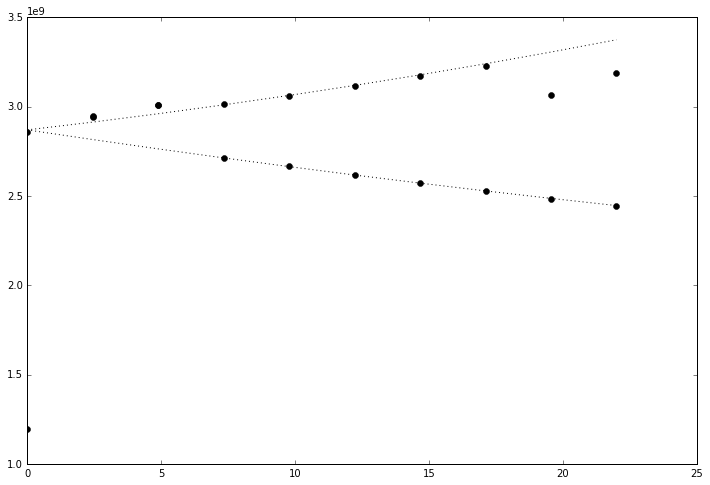

In [108]:
theta = th_0


files = glob.glob(r'C:\Users\Ouyang Group\Documents\Data\7-18-16\MNP 2 wash on CPW 5mW scan 3 x103 y54 ODMR d15_4 T0 *V.txt')
output_file("7-18-16 MNP x103 y54 d15_4 T0 ODMR.html")
bsweep = pd.concat((pd.read_table(f) for f in files),axis=1).values
bsweep = np.nan_to_num(bsweep)
diffs = bsweep[:,1::2]
Bs = np.linspace(0,1,len(files))*(11/0.5)+10**-6

freq = bsweep[:,2]
fits = np.zeros((diffs.shape[1],6))
for i in range(0,diffs.shape[1]):
    O = diffs[:,i]*100
    opt, cov = curve_fit(NV.ODMRfit,freq,O,p0=(-4E8,freq[np.argmin(O)],1E7,-4E8,2.87E9*2-freq[np.argmin(O)],1E7),maxfev=2500)
    fits[i,:] = opt
    
mask = (fits[:,1]<fits[:,4])
mins = fits[:,1]*mask + fits[:,4]*~mask
maxs = fits[:,1]*~mask + fits[:,4]*mask
print theta*180/np.pi
opt1, cov = curve_fit(NV.ODMR_theory_min,Bs[3:10],mins[3:10],p0=(theta))
print "%2f +/- %2f" % (opt1*180/np.pi,np.sqrt(np.diag(cov))[0]*180/np.pi)
opt2, cov = curve_fit(NV.ODMR_theory_max,Bs[0:8],maxs[0:8],p0=(theta))
print "%2f +/- %2f" % (opt2*180/np.pi,np.sqrt(np.diag(cov))[0]*180/np.pi)

plt.plot(Bs,mins,'ko')
plt.plot(Bs,maxs,'ko')


plt.plot(Bs,NV.ODMR_theory_min(Bs,opt1),'k:')
plt.plot(Bs,NV.ODMR_theory_max(Bs,opt2),'k:')

b_f = np.hstack((-Bs[3:10],Bs[0:8]))
f = np.hstack((mins[3:10],maxs[0:8]))

print theta*180/np.pi

b = ([0,0,0],[1,2*np.pi,np.pi])
opt1, cov = curve_fit(ODMR_fit,b_f,f,p0=(0.1,0.001,0.001),bounds=b)
print "b: %2f +/- %2f" % (opt1[0],np.sqrt(np.diag(cov))[0])
print "phi: %2f +/- %2f" % (opt1[1]*180/np.pi,np.sqrt(np.diag(cov))[1]*180/np.pi)
print "theta: %2f +/- %2f" % (opt1[2]*180/np.pi,np.sqrt(np.diag(cov))[2]*180/np.pi)


p = figure(x_range=[Bs[0],Bs[-1]+(Bs[2]-Bs[1])], y_range=[bsweep[0,2],bsweep[-1,2]],tools=TOOLS)
p.image(image=[diffs],x=Bs[0], y=bsweep[0,0], dw=[Bs[-1]+(Bs[2]-Bs[1])], dh=[bsweep[-1,0]-bsweep[0,0]], palette='RdPu9')
Bps = np.append(Bs,Bs[-1]+(Bs[2]-Bs[1]))

p.line(Bps,ODMR_fit(Bps,*opt1),line_dash=(6,6),line_color='black')
p.line(Bps,ODMR_fit(-Bps,*opt1),line_dash=(6,6),line_color='black')

p.line(Bps,NV.ODMR_theory_min(Bps,theta),line_color='blue')
p.line(Bps,NV.ODMR_theory_max(Bps,theta),line_color='blue')

p.circle(Bs[3:10],mins[3:10])
p.circle(Bs[0:8],maxs[0:8])
show(p)

In [71]:
phi_0 = (153+13.8)*np.pi/180
th_0 = (46.7+9)*np.pi/180

t_x = np.pi - np.arccos(np.cos(phi_0)*np.sin(th_0))
t2_x = 60*np.pi/180
b_x = np.tan(t2_x-t_x)

t_y = np.arccos(np.sin(phi_0)*np.sin(th_0))
t2_y = 69*np.pi/180
b_y = np.tan(t2_y-t_y)

t_z = th_0
t2_z = 46*np.pi/180
b_z = np.tan(t2_z-t_z)

print "\t t1 \t t2 \t b"
print "x:\t %.2f \t %.2f \t %.2f" % (t_x*180/np.pi,t2_x*180/np.pi,b_x)
print "y:\t %.2f \t %.2f \t %.2f" % (t_y*180/np.pi,t2_y*180/np.pi,b_y)
print "z:\t %.2f \t %.2f \t %.2f" % (t_z*180/np.pi,t2_z*180/np.pi,b_z)

	 t1 	 t2 	 b
x:	 36.46 	 60.00 	 0.44
y:	 79.13 	 69.00 	 -0.18
z:	 55.70 	 46.00 	 -0.17


Phi: 186.854673 +/- 0.810260
Theta: 34.551050 or +/- 0.468892
Phi(naive): 185.056000
Theta(naive): 38.247849


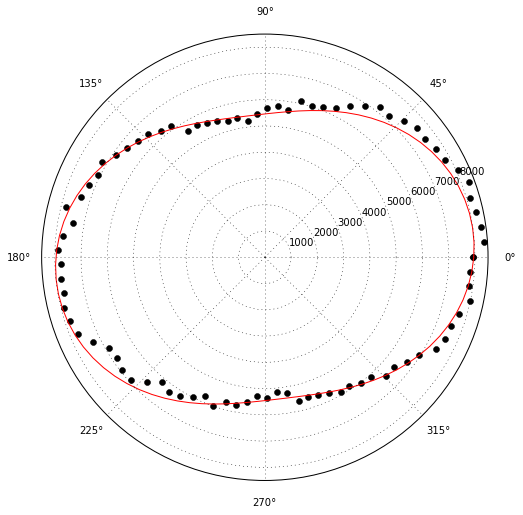

In [37]:
t = np.loadtxt(r'C:\Users\Ouyang Group\Documents\Data\7-18-16\MNP 2 wash on CPW 1mW scan 3 x10 y88 rotor sweep 2')
t[:,1] = t[:,1]-4000
NV.OrientPol(t)

In [115]:
def ODMR_MNP(B_0,phi_0,theta_0,b,phi_m,theta_m):
    #B_0 is the magnitude of the applied field from the GMW magnet
    #phi_0,theta_0 are the angle of the applied field
    #b is the field coefficient for the MNP, proportional to B_0
    #phi_m,theta_m are the angles of the MNP field
    
    D = 2.85E9
    g = 28E6 #MHz/mT, B should be in mT
    
    B_p = np.sqrt(B_0**2*((np.cos(phi_0)*np.sin(theta_0)+b*np.cos(phi_m)*np.sin(theta_m))**2 + 
                          (np.sin(phi_0)*np.sin(theta_0)+b*np.sin(phi_m)*np.sin(theta_m))**2))
    B_z = B_0*(np.cos(theta_0)+b*np.cos(theta_m))
    
    f_0 = D + 3*g**2*B_p**2/(2*D)
    f_1 = g*B_z*np.sqrt( 1 + (g*B_p**2/(2*D*B_z))**2)
    
    return f_0+f_1

43.5
27.405573 +/- 0.502148
47.326829 +/- 212.575985
43.5
b: 0.093455 +/- 0.024238
phi: 0.005730 +/- 25492948.740533
theta: 0.005730 +/- 965.427085


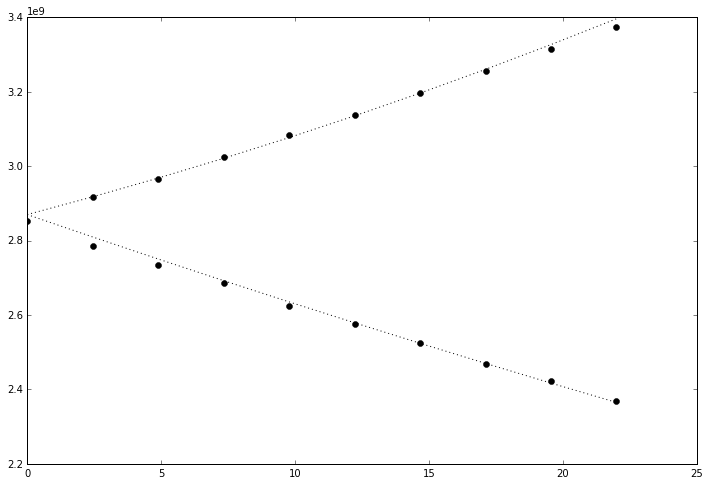

In [121]:
phi_0 = (6.85+13.8)*np.pi/180
th_0 = (34.5+9)*np.pi/180
theta = th_0

def ODMR_fit(B_0,b,phi_m,theta_m):
    return ODMR_MNP(B_0,phi_0,th_0,b,phi_m,theta_m)

files = glob.glob(r'C:\Users\Ouyang Group\Documents\Data\7-18-16\MNP 2 wash on CPW 5mW scan 3 x10 y88 d15_4 T0 *V.txt')
output_file("7-18-16 MNP x103 y54 d15_4 T0 ODMR.html")
bsweep = pd.concat((pd.read_table(f) for f in files),axis=1).values
bsweep = np.nan_to_num(bsweep)
diffs = bsweep[:,1::2]
Bs = np.linspace(0,1,len(files))*(11/0.5)+10**-6

freq = bsweep[:,2]
fits = np.zeros((diffs.shape[1],6))
for i in range(0,diffs.shape[1]):
    O = diffs[:,i]*100
    opt, cov = curve_fit(NV.ODMRfit,freq,O,p0=(-4E8,freq[np.argmin(O)],1E7,-4E8,2.87E9*2-freq[np.argmin(O)],1E7),maxfev=2500)
    fits[i,:] = opt

mask = (fits[:,1]<fits[:,4])
mins = fits[:,1]*mask + fits[:,4]*~mask
maxs = fits[:,1]*~mask + fits[:,4]*mask
print theta*180/np.pi
opt1, cov = curve_fit(NV.ODMR_theory_min,Bs[3:10],mins[3:10],p0=(theta))
print "%2f +/- %2f" % (opt1*180/np.pi,np.sqrt(np.diag(cov))[0]*180/np.pi)
opt2, cov = curve_fit(NV.ODMR_theory_max,Bs[0:8],maxs[0:8],p0=(theta))
print "%2f +/- %2f" % (opt2*180/np.pi,np.sqrt(np.diag(cov))[0]*180/np.pi)

plt.plot(Bs,mins,'ko')
plt.plot(Bs[1:10],maxs[1:10],'ko')


plt.plot(Bs,NV.ODMR_theory_min(Bs,opt1),'k:')
plt.plot(Bs,NV.ODMR_theory_max(Bs,opt2),'k:')

b_f = np.hstack((-Bs[0:10],Bs[1:10]))
f = np.hstack((mins[0:10],maxs[1:10]))

print theta*180/np.pi

b = ([10**-4,10**-4,10**-4],[1,2*np.pi,np.pi])
opt1, cov = curve_fit(ODMR_fit,b_f,f,p0=(0.5,0.051,0.001),bounds=b)
print "b: %2f +/- %2f" % (opt1[0],np.sqrt(np.diag(cov))[0])
print "phi: %2f +/- %2f" % (opt1[1]*180/np.pi,np.sqrt(np.diag(cov))[1]*180/np.pi)
print "theta: %2f +/- %2f" % (opt1[2]*180/np.pi,np.sqrt(np.diag(cov))[2]*180/np.pi)


p = figure(x_range=[Bs[0],Bs[-1]+(Bs[2]-Bs[1])], y_range=[bsweep[0,2],bsweep[-1,2]],tools=TOOLS)
p.image(image=[diffs],x=Bs[0], y=bsweep[0,0], dw=[Bs[-1]+(Bs[2]-Bs[1])], dh=[bsweep[-1,0]-bsweep[0,0]], palette='RdPu9')
Bps = np.append(Bs,Bs[-1]+(Bs[2]-Bs[1]))

p.line(Bps,ODMR_fit(Bps,*opt1),line_dash=(6,6),line_color='black')
p.line(Bps,ODMR_fit(-Bps,*opt1),line_dash=(6,6),line_color='black')

p.line(Bps,ODMR_fit(Bps,0,0,0),line_color='blue')
p.line(Bps,ODMR_fit(-Bps,0,0,0),line_color='blue')

p.circle(Bs[0:10],mins[0:10])
p.circle(Bs[1:10],maxs[1:10])
show(p)

In [85]:
cov

array([[  1.03580783e-03,   0.00000000e+00,  -5.55518726e-04],
       [  0.00000000e+00,   0.00000000e+00,   0.00000000e+00],
       [ -5.55518726e-04,   0.00000000e+00,   1.04730473e+00]])

36.9058884602
67.717660 +/- 11.739403
89.993354 +/- 9438.264333
36.9058884602
b: 0.489425 +/- 35947.124289
phi: 54.824679 +/- 151556072.083336
theta: 167.257803 +/- 18609541.889055


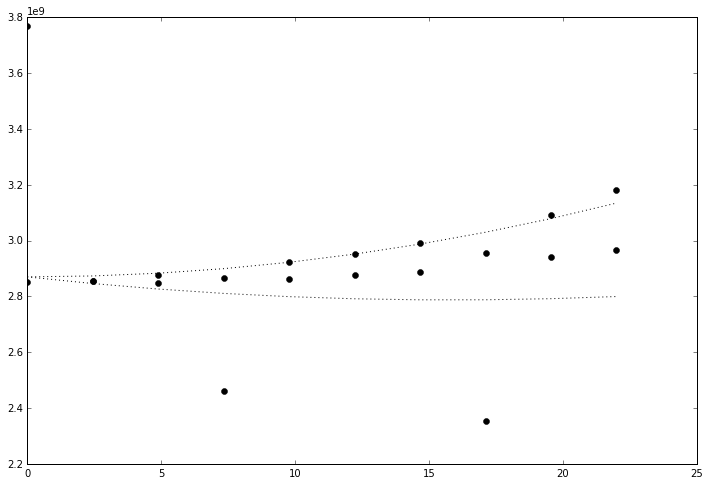

In [126]:
theta = np.cos(phi_0)*np.sin(th_0)

files = glob.glob(r'C:\Users\Ouyang Group\Documents\Data\7-18-16\MNP 2 wash on CPW 5mW scan 3 x10 y88 T0 *V.txt')
output_file("7-18-16 MNP x10 y88 T0 ODMR.html")
bsweep = pd.concat((pd.read_table(f) for f in files),axis=1).values
bsweep = np.nan_to_num(bsweep)
diffs = bsweep[:,1::2]
Bs = np.linspace(0,1,len(files))*(11/0.5)+10**-6

freq = bsweep[:,2]
fits = np.zeros((diffs.shape[1],6))
for i in range(0,diffs.shape[1]):
    O = diffs[:,i]*100
    opt, cov = curve_fit(NV.ODMRfit,freq,O,p0=(-4E8,freq[np.argmin(O)],1E7,-4E8,2.87E9*2-freq[np.argmin(O)],1E7),maxfev=2500)
    fits[i,:] = opt

mask = (fits[:,1]<fits[:,4])
mins = fits[:,1]*mask + fits[:,4]*~mask
maxs = fits[:,1]*~mask + fits[:,4]*mask
print theta*180/np.pi
opt1, cov = curve_fit(NV.ODMR_theory_min,Bs[3:10],mins[3:10],p0=(theta))
print "%2f +/- %2f" % (opt1*180/np.pi,np.sqrt(np.diag(cov))[0]*180/np.pi)
opt2, cov = curve_fit(NV.ODMR_theory_max,Bs[0:8],maxs[0:8],p0=(theta))
print "%2f +/- %2f" % (opt2*180/np.pi,np.sqrt(np.diag(cov))[0]*180/np.pi)

plt.plot(Bs,mins,'ko')
plt.plot(Bs,maxs,'ko')


plt.plot(Bs,NV.ODMR_theory_min(Bs,opt1),'k:')
plt.plot(Bs,NV.ODMR_theory_max(Bs,opt2),'k:')

b_f = np.hstack((-Bs[0:10],Bs[1:10]))
f = np.hstack((mins[0:10],maxs[1:10]))

print theta*180/np.pi

b = ([0,0,0],[1,2*np.pi,np.pi])
opt1, cov = curve_fit(ODMR_fit,b_f,f,p0=(0.5,0.051,0.001),bounds=b)
print "b: %2f +/- %2f" % (opt1[0],np.sqrt(np.diag(cov))[0])
print "phi: %2f +/- %2f" % (opt1[1]*180/np.pi,np.sqrt(np.diag(cov))[1]*180/np.pi)
print "theta: %2f +/- %2f" % (opt1[2]*180/np.pi,np.sqrt(np.diag(cov))[2]*180/np.pi)


p = figure(x_range=[Bs[0],Bs[-1]+(Bs[2]-Bs[1])], y_range=[bsweep[0,2],bsweep[-1,2]],tools=TOOLS)
p.image(image=[diffs],x=Bs[0], y=bsweep[0,0], dw=[Bs[-1]+(Bs[2]-Bs[1])], dh=[bsweep[-1,0]-bsweep[0,0]], palette='RdPu9')
Bps = np.append(Bs,Bs[-1]+(Bs[2]-Bs[1]))

p.line(Bps,ODMR_fit(Bps,*opt1),line_dash=(6,6),line_color='black')
p.line(Bps,ODMR_fit(-Bps,*opt1),line_dash=(6,6),line_color='black')

p.line(Bps,NV.ODMR_theory_min(Bps,theta),line_color='blue')
p.line(Bps,NV.ODMR_theory_max(Bps,theta),line_color='blue')

#p.circle(Bs[0:10],mins[0:10])
#p.circle(Bs[1:10],maxs[1:10])
show(p)

13.9087802207
48.592413 +/- 7.354761
59.542083 +/- 78.617756
13.9087802207
b: 0.000000 +/- 16.449027
phi: 100.971838 +/- 0.000000
theta: 0.000036 +/- 0.000000


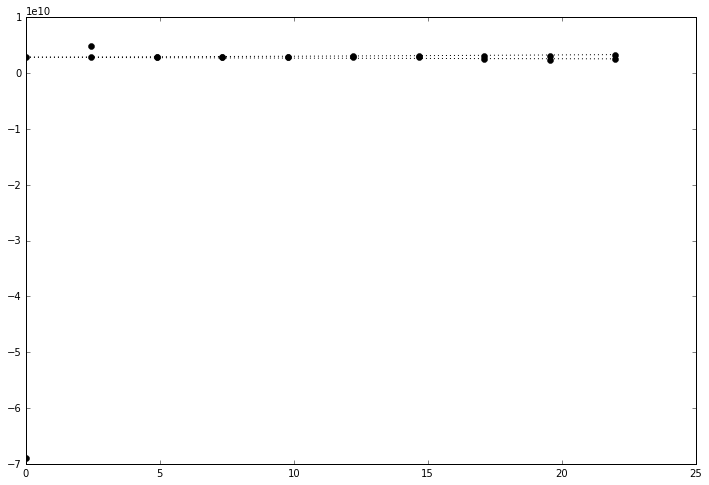

In [127]:
theta = np.sin(phi_0)*np.sin(th_0)

files = glob.glob(r'C:\Users\Ouyang Group\Documents\Data\7-19-16\MNP #2 wash 2 CPW 5mW scan 1 x0 y68 T90 *V.txt')
output_file("7-18-16 MNP x10 y88 T90 ODMR.html")
bsweep = pd.concat((pd.read_table(f) for f in files),axis=1).values
bsweep = np.nan_to_num(bsweep)
diffs = bsweep[:,1::2]
Bs = np.linspace(0,1,len(files))*(11/0.5)+10**-6

freq = bsweep[:,2]
fits = np.zeros((diffs.shape[1],6))
for i in range(0,diffs.shape[1]):
    O = diffs[:,i]*100
    opt, cov = curve_fit(NV.ODMRfit,freq,O,p0=(-4E8,freq[np.argmin(O)],1E7,-4E8,2.87E9*2-freq[np.argmin(O)],1E7),maxfev=2500)
    fits[i,:] = opt

mask = (fits[:,1]<fits[:,4])
mins = fits[:,1]*mask + fits[:,4]*~mask
maxs = fits[:,1]*~mask + fits[:,4]*mask
print theta*180/np.pi
opt1, cov = curve_fit(NV.ODMR_theory_min,Bs[3:10],mins[3:10],p0=(theta))
print "%2f +/- %2f" % (opt1*180/np.pi,np.sqrt(np.diag(cov))[0]*180/np.pi)
opt2, cov = curve_fit(NV.ODMR_theory_max,Bs[0:8],maxs[0:8],p0=(theta))
print "%2f +/- %2f" % (opt2*180/np.pi,np.sqrt(np.diag(cov))[0]*180/np.pi)

plt.plot(Bs,mins,'ko')
plt.plot(Bs,maxs,'ko')


plt.plot(Bs,NV.ODMR_theory_min(Bs,opt1),'k:')
plt.plot(Bs,NV.ODMR_theory_max(Bs,opt2),'k:')

b_f = np.hstack((-Bs[0:6],Bs[1:10]))
f = np.hstack((mins[0:6],maxs[1:10]))

print theta*180/np.pi

b = ([0,0,0],[1,2*np.pi,np.pi])
opt1, cov = curve_fit(ODMR_fit,b_f,f,p0=(0.5,0.001,0.001),bounds=b)
print "b: %2f +/- %2f" % (opt1[0],np.sqrt(np.diag(cov))[0])
print "phi: %2f +/- %2f" % (opt1[1]*180/np.pi,np.sqrt(np.diag(cov))[1]*180/np.pi)
print "theta: %2f +/- %2f" % (opt1[2]*180/np.pi,np.sqrt(np.diag(cov))[2]*180/np.pi)


p = figure(x_range=[Bs[0],Bs[-1]+(Bs[2]-Bs[1])], y_range=[bsweep[0,2],bsweep[-1,2]],tools=TOOLS)
p.image(image=[diffs],x=Bs[0], y=bsweep[0,0], dw=[Bs[-1]+(Bs[2]-Bs[1])], dh=[bsweep[-1,0]-bsweep[0,0]], palette='RdPu9')

Bps = np.append(Bs,Bs[-1]+(Bs[2]-Bs[1]))

p.line(Bps,ODMR_fit(Bps,*opt1),line_dash=(6,6),line_color='black')
p.line(Bps,ODMR_fit(-Bps,*opt1),line_dash=(6,6),line_color='black')

p.line(Bps,NV.ODMR_theory_min(Bps,theta),line_color='blue')
p.line(Bps,NV.ODMR_theory_max(Bps,theta),line_color='blue')


p.circle(Bs[0:6],mins[0:6])
p.circle(Bs[1:10],maxs[1:10])
show(p)